In [1]:
# Necessary libraries
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap

# Part 1 - Exploring Crime Rates
A good community should ideally have lower crime rates to accomodate its residents.

In [2]:
crime_data = pd.read_csv("crime_data.csv", encoding = "latin1", low_memory = False)

In [3]:
crime_data.head()

,PK,CCR,HIERARCHY,INCIDENTTIME,INCIDENTLOCATION,CLEAREDFLAG,INCIDENTNEIGHBORHOOD,INCIDENTZONE,HIERARCHYDESC,OFFENSES,INCIDENTTRACT,X,Y
0,2075487,5000381,6,1/1/2005 8:00,"5400 Block NORTHUMBERLAND ST PITTSBURGH, PA",N,Squirrel Hill North,4,MOTOR THEFT (OTHER)-PLATE ONLY,3921 Theft by Unlawful Taking or Disposition.,1401.0,-79.934027,40.438870
1,2075783,5001279,7,1/3/2005 2:00,"PARKVIEW PITTSBURGH, PA",N,Squirrel Hill North,4,MTR VEH THEFT (AUTO),3921 Theft by Unlawful Taking or Disposition.,407.0,0.000000,0.000000
2,2075786,5001488,7,1/3/2005 17:00,"CROSBY AND PAULINE & PITTSBURGH, PA",N,Squirrel Hill North,3,MOTOR VEH THEFT/TRUCK-BUS,3921 Theft by Unlawful Taking or Disposition.,1907.0,0.000000,0.000000
3,2076278,5002628,7,1/5/2005 19:30,"1100 Block COLFAX ST PITTSBURGH, PA",N,Squirrel Hill North,1,MTR VEH THEFT (AUTO),3921 Theft by Unlawful Taking or Disposition.,2102.0,-80.024329,40.462542
4,2076279,5002647,7,1/5/2005 20:20,"ALDER/SHADY & PITTSBURGH, PA",N,Shadyside,4,MTR VEH THEFT (AUTO),3921 Theft by Unlawful Taking or Disposition.,705.0,0.000000,0.000000


In [4]:
crime_data["INCIDENTNEIGHBORHOOD"].unique()

array(['Squirrel Hill North', 'Shadyside', 'Bedford Dwellings',
       'Lincoln-Lemington-Belmar', 'Lower Lawrenceville',
       'Central Lawrenceville', 'Golden Triangle/Civic Arena', 'Carrick',
       'Highland Park', 'South Side Flats', 'Middle Hill',
       'North Oakland', 'Bloomfield', 'Outside City', 'East Hills',
       'Knoxville', 'Point Breeze', 'Central Oakland', 'Brighton Heights',
       'Point Breeze North', 'Homewood North', 'Regent Square',
       'Homewood West', 'Homewood South', 'Perry North', nan,
       'West Oakland', 'Hazelwood', 'St. Clair', 'Northview Heights',
       'Oakwood', 'Arlington', 'North Shore', 'Westwood', 'Upper Hill',
       'Polish Hill', 'Crawford-Roberts', 'Lincoln Place',
       'Allegheny West', 'Larimer', 'Glen Hazel', 'Bon Air',
       'Arlington Heights', 'Allentown', 'New Homestead', 'Hays',
       'Central Northside', 'Stanton Heights', 'Allegheny Center',
       'Friendship', 'East Carnegie', 'Fairywood', 'Windgap',
       'Squirrel Hi

In [5]:
crime_counts = crime_data["INCIDENTNEIGHBORHOOD"].value_counts()
safest_neighborhoods = crime_counts.sort_values().head(10)
print("Safest Neighborhoods (Fewest Crimes Reported):")
print(safest_neighborhoods)

Safest Neighborhoods (Fewest Crimes Reported):
INCIDENTNEIGHBORHOOD
Outside County             201
Outside State              202
Mt. Oliver Boro            239
Chartiers City             427
New Homestead              459
Swisshelm Park             616
East Carnegie              734
Summer Hill                784
Ridgemont                  817
Mt. Oliver Neighborhood    852
Name: count, dtype: int64


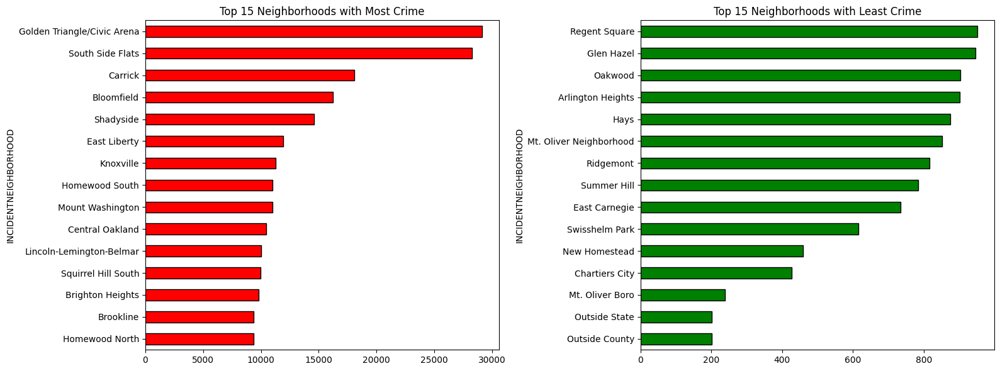

In [6]:
fig, ax = plt.subplots(1, 2, figsize = (16, 6))
crime_counts.head(15).plot(kind = "barh", ax = ax[0], color = "red", edgecolor = "black")
ax[0].set_title("Top 15 Neighborhoods with Most Crime")
ax[0].invert_yaxis()
crime_counts.tail(15).plot(kind = "barh", ax = ax[1], color = "green", edgecolor = "black")
ax[1].set_title("Top 15 Neighborhoods with Least Crime")
ax[1].invert_yaxis()
plt.tight_layout()
plt.show()

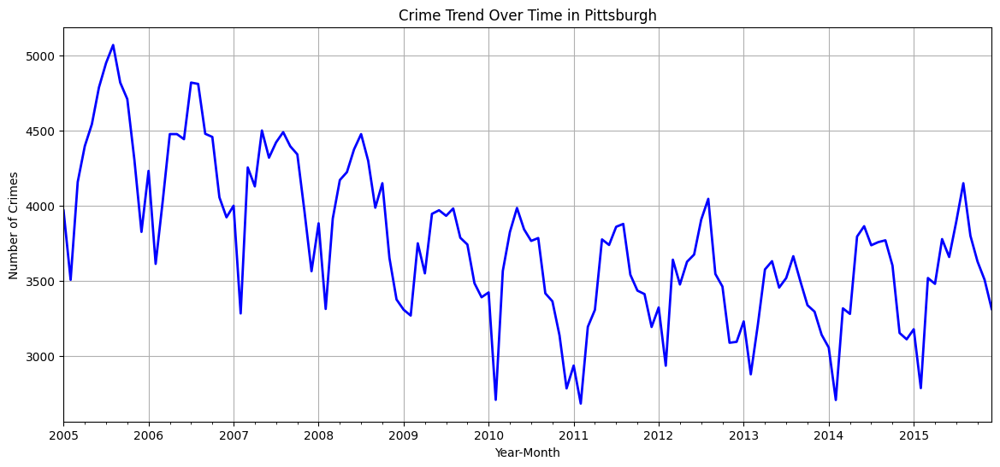

In [7]:
crime_data["INCIDENTTIME"] = pd.to_datetime(crime_data["INCIDENTTIME"], errors = "coerce")
crime_data["YEAR"] = crime_data["INCIDENTTIME"].dt.year
crime_data["MONTH"] = crime_data["INCIDENTTIME"].dt.to_period("M")
monthly_crime = crime_data["MONTH"].value_counts().sort_index()
plt.figure(figsize = (14, 6))
monthly_crime.plot(color = "blue", linewidth = 2)
plt.title("Crime Trend Over Time in Pittsburgh")
plt.xlabel("Year-Month")
plt.ylabel("Number of Crimes")
plt.grid()

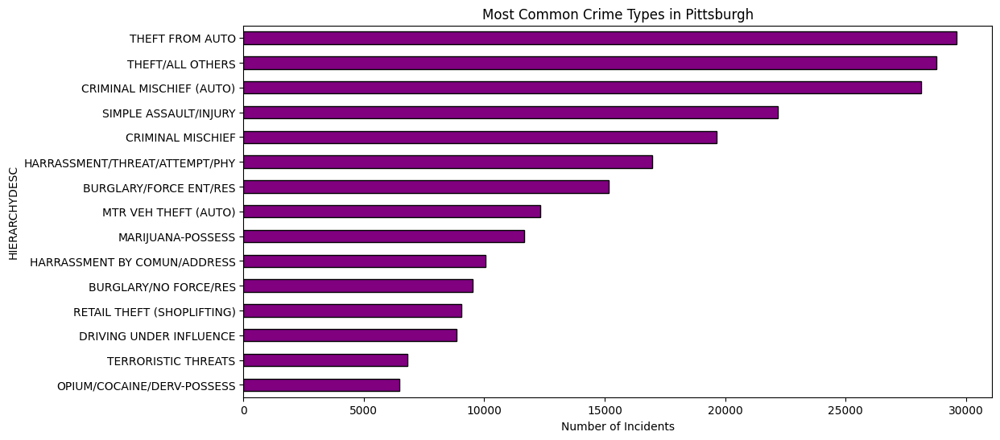

In [8]:
crime_types = crime_data["HIERARCHYDESC"].value_counts()
plt.figure(figsize = (12, 6))
crime_types.head(15).plot(kind = "barh", color = "purple", edgecolor = "black")
plt.title("Most Common Crime Types in Pittsburgh")
plt.xlabel("Number of Incidents")
plt.gca().invert_yaxis()
plt.show()

In [9]:
crime_data_filtered = crime_data.dropna(subset = ["X", "Y"])
crime_data_filtered = crime_data_filtered[(crime_data_filtered["X"] != 0) & (crime_data_filtered["Y"] != 0)]
m = folium.Map(location = [40.4406, -79.9959], zoom_start = 12)
HeatMap(data = crime_data_filtered[["Y", "X"]], radius = 10).add_to(m)
m

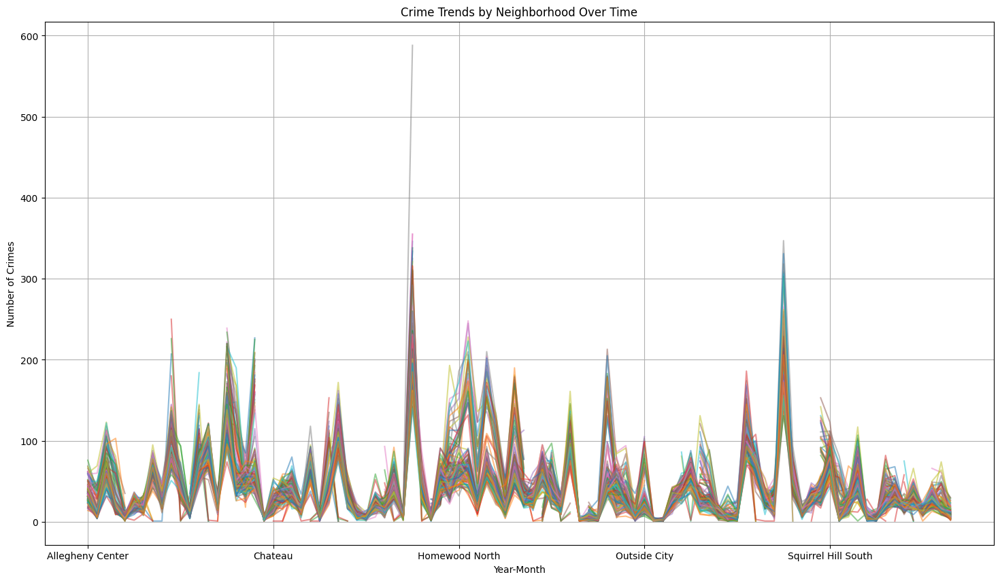

In [10]:
crime_by_neighborhood_month = crime_data.groupby(["MONTH", "INCIDENTNEIGHBORHOOD"]).size().unstack()
crime_by_neighborhood_month.T.plot(figsize = (18, 10), alpha = 0.5, legend = False)
plt.title("Crime Trends by Neighborhood Over Time")
plt.xlabel("Year-Month")
plt.ylabel("Number of Crimes")
plt.grid()
plt.show()

In [11]:
crime_trends = crime_by_neighborhood_month.diff().sum()
crime_trends.sort_values(ascending = False).head(5)

INCIDENTNEIGHBORHOOD
East Liberty        95.0
Brookline           73.0
Sheraden            68.0
Beechview           67.0
Mount Washington    64.0
dtype: float64

In [12]:
crime_data["YEAR"] = crime_data["INCIDENTTIME"].dt.year
crime_trend = crime_data.groupby(["YEAR", "INCIDENTNEIGHBORHOOD"]).size().unstack()
crime_trend_pct_change = crime_trend.pct_change(fill_method = None).fillna(0).mean().sort_values()
print("Neighborhoods with decreasing crime:")
print(crime_trend_pct_change.head(10))
print("Neighborhoods with increasing crime:")
print(crime_trend_pct_change.tail(10))

Neighborhoods with decreasing crime:
INCIDENTNEIGHBORHOOD
St. Clair        -0.131162
Homewood West    -0.101206
Ridgemont        -0.100096
Friendship       -0.098732
Outside City     -0.096639
Bloomfield       -0.084289
East Carnegie    -0.083591
North Oakland    -0.082162
Homewood South   -0.080863
Lincoln Place    -0.079620
dtype: float64
Neighborhoods with increasing crime:
INCIDENTNEIGHBORHOOD
Crafton Heights          20.770526
Chateau                  20.804929
Morningside              23.300574
California-Kirkbride     24.081988
South Side Slopes        25.104863
South Shore              26.694322
Spring Hill-City View    32.713820
Beltzhoover              33.359215
South Oakland            35.274691
Terrace Village          51.556502
dtype: float64


<Figure size 1200x600 with 0 Axes>

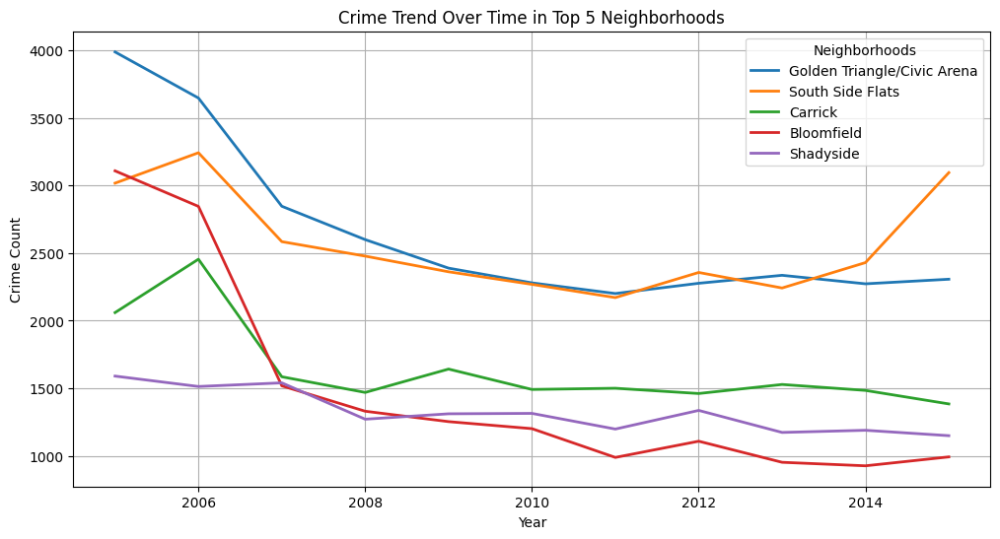

In [13]:
plt.figure(figsize = (12, 6))
top_neighborhoods = crime_trend.sum().nlargest(5).index
crime_trend[top_neighborhoods].plot(figsize = (12, 6), linewidth = 2)
plt.title("Crime Trend Over Time in Top 5 Neighborhoods")
plt.xlabel("Year")
plt.ylabel("Crime Count")
plt.legend(title = "Neighborhoods")
plt.grid(True)
plt.show()